<a href="https://colab.research.google.com/github/tommycwong/ensemble_TEM/blob/master/TEM_Helium_Bubbles_Image_Processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Processing for TEM Bubbles

Notebook prepared by Maxim Ziatdinov and Tommy Wong

The purpose of this notebook is to process the image data sets used in training and testing the DNN.

Mount Google drive:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Import necessary modules:

In [ ]:
# Modules for reading in image files
import os
import glob
from google.colab import files
os.chdir('/content/drive/Shared drives/NESLS/TEM_Helium_Bubbles_[Proper]')
from pydm3reader import dm3_lib as dm3

# Modules for image processing
import numpy as np
import cv2
import matplotlib.pyplot as plt

Change directory to the folder containing images for training and predictions:

In [ ]:
os.chdir('Data')

## Training Images

Create directory path for the images used for training:

In [ ]:
train_dir = 'Training data'

In [ ]:
filepaths_dm3 = np.array([])
for filepath_dm3 in glob.glob(os.path.join(train_dir, '*.dm3')):
    filepaths_dm3 = np.append(filepaths_dm3, filepath_dm3)
filepaths_dm3 = np.sort(filepaths_dm3)

filepaths_tif = np.array([])
for filepath_tif in glob.glob(os.path.join(train_dir, '*f.tif')):
    filepaths_tif = np.append(filepaths_tif, filepath_tif)
filepaths_tif = np.sort(filepaths_tif)

Read each file as a numpy array and resize the data:

In [ ]:
# Specify image size
rs = 1024

# Initialise numpy arrays and fill with image data
train_img = np.zeros((rs, rs, len(filepaths_tif)))
train_lab = np.zeros((rs, rs, len(filepaths_tif)))

for i in range(len(filepaths_tif)):
    # Read in dm3 files as images
    dm3f = dm3.DM3(filepaths_dm3[i])
    train_img_i = dm3f.imagedata

    # Read in labels
    train_lab_i = plt.imread(filepaths_tif[i])
    
    if train_lab_i.ndim > 2:
        train_lab_i = train_lab_i[:, :, 0]

    # Resize images to specified size
    train_img[:, :, i] = cv2.resize(train_img_i, (rs, rs), cv2.INTER_CUBIC)
    train_lab[:, :, i] = cv2.resize(train_lab_i, (rs, rs), cv2.INTER_CUBIC)

Remove the bright spot at the bottom of the images and resize the images back to `rs` by `rs`:

In [ ]:
# Remove the bright spot at the bottom of the images
for i in range(2, len(filepaths_tif)):
    train_img_c = train_img[0 : 900, 0 : 900, i]
    train_lab_c = train_lab[0 : 900, 0 : 900, i]
    train_img[:, :, i] = cv2.resize(train_img_c, (rs, rs), cv2.INTER_CUBIC) 
    train_lab[:, :, i] = cv2.resize(train_lab_c, (rs, rs), cv2.INTER_CUBIC)


Manually remove the unmarked bubbles and resize the images back to `rs` by `rs`:

In [ ]:
# Manually remove the unmarked bubbles
# Currently with the same cropping along the x-axis to maintain aspect ratio
i = 0
y1 = 30
train_img_c = train_img[y1 :, y1 :, i]
train_lab_c = train_lab[y1 :, y1 :, i]
train_img[:, :, i] = cv2.resize(train_img_c, (rs, rs), cv2.INTER_CUBIC) 
train_lab[:, :, i] = cv2.resize(train_lab_c, (rs, rs), cv2.INTER_CUBIC)

i = 10
y1 = 90
y2 = 1023
train_img_c = train_img[y1 : y2, y1 : y2, i]
train_lab_c = train_lab[y1 : y2, y1 : y2, i]
train_img[:, :, i] = cv2.resize(train_img_c, (rs, rs), cv2.INTER_CUBIC) 
train_lab[:, :, i] = cv2.resize(train_lab_c, (rs, rs), cv2.INTER_CUBIC)

i = 1
y1 = 30
y2 = 1000
train_img_c = train_img[y1 : y2, y1 : y2, i]
train_lab_c = train_lab[y1 : y2, y1 : y2, i]
train_img[:, :, i] = cv2.resize(train_img_c, (rs, rs), cv2.INTER_CUBIC) 
train_lab[:, :, i] = cv2.resize(train_lab_c, (rs, rs), cv2.INTER_CUBIC)

i = 8
y1 = 0
y2 = 1000
train_img_c = train_img[y1 : y2, y1 : y2, i]
train_lab_c = train_lab[y1 : y2, y1 : y2, i]
train_img[:, :, i] = cv2.resize(train_img_c, (rs, rs), cv2.INTER_CUBIC) 
train_lab[:, :, i] = cv2.resize(train_lab_c, (rs, rs), cv2.INTER_CUBIC)

Normalize data:

In [ ]:
for i in range(len(filepaths_tif)):
    train_img[:, :, i] = (train_img[:, :, i] - np.amin(train_img[:, :, i]))/np.ptp(train_img[:, :, i])
    train_lab[:, :, i] = (train_lab[:, :, i] - np.amin(train_lab[:, :, i]))/np.ptp(train_lab[:, :, i])

    # Invert features map
    train_lab[:, :, i] = 1 - train_lab[:, :, i]


Visualize the training images:

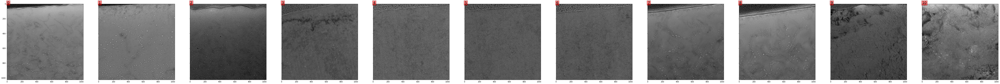

In [ ]:
fig, axes = plt.subplots(1, len(filepaths_tif), figsize=(100, 100), sharex=True, sharey=True)
ax = axes.ravel()
for i in range(len(filepaths_tif)):
    ax[i].imshow(train_img[:, :, i], cmap='gist_gray')
    ax[i].text(0.5, 0.5, i, size=20, bbox=dict(facecolor='red', alpha=0.5))

Visualize the training labels:

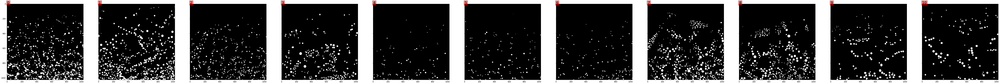

In [ ]:
fig, axes = plt.subplots(1, len(filepaths_tif), figsize=(100, 100), sharex=True, sharey=True)
ax = axes.ravel()
for i in range(len(filepaths_tif)):
    ax[i].imshow(train_lab[:, :, i], cmap='gist_gray')
    ax[i].text(0.5, 0.5, i, size=20, bbox=dict(facecolor='red', alpha=0.5))

Save numpy data in the training data folder:

In [ ]:
# Save numpy data in the folder
os.chdir(train_dir)

_filename_dm3 = os.path.splitext('train_images')[0]+'.npy'
np.save(_filename_dm3, train_img)
_filename_map = os.path.splitext('train_labels')[0]+'.npy'
np.save(_filename_map, train_lab)

## Testing Images

Create directory path for the images used for testing:

In [ ]:
os.chdir('/content/drive/Shared drives/NESLS/TEM_Helium_Bubbles_[Proper]/Data')
test_dir = 'Unprocessed data'

In [ ]:
filepaths_dm3 = np.array([])
for filepath_dm3 in glob.glob(os.path.join(test_dir, '*.dm3')):
    filepaths_dm3 = np.append(filepaths_dm3, filepath_dm3)
filepaths_dm3 = np.sort(filepaths_dm3)

Read each file as a numpy array and resize the data:

In [ ]:
# Specify image size
rs = 1024

# Initialise numpy arrays and fill with image data
test_img = np.zeros((rs, rs, len(filepaths_dm3)))

for i in range(len(filepaths_dm3)):
    # Read in dm3 files as images
    dm3f = dm3.DM3(filepaths_dm3[i])
    test_img_i = dm3f.imagedata
    test_img[:, :, i] = cv2.resize(test_img_i, (rs, rs), cv2.INTER_CUBIC)

Crop and resize the images back to `rs` by `rs`:

In [ ]:
# Remove the bright spot at the bottom of the images
for k in range(len(filepaths_dm3)):
    test_img_i = test_img[0 : 950, 0 : 950, k]
    test_img[:, :, k] = cv2.resize(test_img_i, (rs, rs), cv2.INTER_CUBIC)

Normalize data:

In [ ]:
for i in range(len(filepaths_dm3)):
    test_img[:, :, i] = (test_img[:, :, i] - np.amin(test_img[:, :, i]))/np.ptp(test_img[:, :, i])

Visulaize the images:

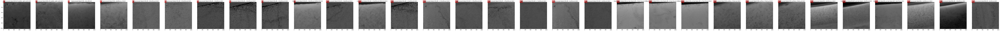

In [ ]:
fig, axes = plt.subplots(1, len(filepaths_dm3), figsize=(200, 200), sharex=True, sharey=True)
ax = axes.ravel()
for i in range(len(filepaths_dm3)):
    ax[i].imshow(test_img[:, :, i], cmap='gist_gray')
    ax[i].set_title(filepaths_dm3[i])
    ax[i].text(0.5, 0.5, i, size=20, bbox=dict(facecolor='red', alpha=0.5))

Save numpy data in the testing data folder:

In [ ]:
# Save numpy data in the folder
os.chdir(test_dir)

_filename_dm3 = os.path.splitext('test_images')[0]+'.npy'
np.save(_filename_dm3, test_img)

## Accuracy Images

Create directory path for the images used for validating the accuracy:

In [ ]:
os.chdir('/content/drive/Shared drives/NESLS/TEM_Helium_Bubbles_[Proper]/Data')
acc_orig_dir = 'Accuracy validation data/Original_Images'
acc_labels_1_dir = 'Accuracy validation data/Fan_Labels'
acc_labels_2_dir = 'Accuracy validation data/Wang_Labels'
acc_labels_3_dir = 'Accuracy validation data/Wong_Labels'

In [ ]:
filepaths_dm3 = np.array([])
for filepath_dm3 in glob.glob(os.path.join(acc_orig_dir, '*.dm3')):
    filepaths_dm3 = np.append(filepaths_dm3, filepath_dm3)
filepaths_dm3 = np.sort(filepaths_dm3)

filepaths_lab_1 = np.array([])
for filepath_tif in glob.glob(os.path.join(acc_labels_1_dir, '*.tif')):
    filepaths_lab_1 = np.append(filepaths_lab_1, filepath_tif)
filepaths_lab_1 = np.sort(filepaths_lab_1)

filepaths_lab_2 = np.array([])
for filepath_tif in glob.glob(os.path.join(acc_labels_2_dir, '*.tif')):
    filepaths_lab_2 = np.append(filepaths_lab_2, filepath_tif)
filepaths_lab_2 = np.sort(filepaths_lab_2)

filepaths_lab_3 = np.array([])
for filepath_tif in glob.glob(os.path.join(acc_labels_3_dir, '*labels.tif')):
    filepaths_lab_3 = np.append(filepaths_lab_3, filepath_tif)
filepaths_lab_3 = np.sort(filepaths_lab_3)

Import the images:

In [ ]:
# Specify image size
rs = 1024

# Initialise numpy arrays and fill with image data
acc_orig = np.zeros((rs, rs, len(filepaths_dm3)))
acc_lab_1 = np.zeros((rs, rs, len(filepaths_dm3)))
acc_lab_2 = np.zeros((rs, rs, len(filepaths_dm3)))
acc_lab_3 = np.zeros((rs, rs, len(filepaths_dm3)))

for i in range(len(filepaths_dm3)):
    
    # Read in dm3 files as images
    dm3f = dm3.DM3(filepaths_dm3[i])
    acc_orig_i = dm3f.imagedata
    acc_orig_i = acc_orig_i[0 : 3797, 0 : 3797] # crop out the bright spot
    acc_orig_i = cv2.resize(acc_orig_i, (rs, rs), cv2.INTER_CUBIC) # resize to rs by rs
    acc_orig[:, :, i] = (acc_orig_i - np.amin(acc_orig_i))/np.ptp(acc_orig_i) # normalize
    
    # Read in labels for researchers 1, 2, and 3, crop and resize the images to rs by rs
    acc_lab_1_i = plt.imread(filepaths_lab_1[i])    
    if acc_lab_1_i.ndim > 2:
        acc_lab_1_i = acc_lab_1_i[:, :, 0]
    acc_lab_1_i = acc_lab_1_i[0 : 3797, 0 : 3797]
    acc_lab_1_i = cv2.resize(acc_lab_1_i, (rs, rs), cv2.INTER_CUBIC)
    acc_lab_1_i = (acc_lab_1_i - np.amin(acc_lab_1_i))/np.ptp(acc_lab_1_i)
    acc_lab_1[:, :, i] = 1 - acc_lab_1_i # invert the labels

    acc_lab_2_i = plt.imread(filepaths_lab_2[i])    
    if acc_lab_2_i.ndim > 2:
        acc_lab_2_i = acc_lab_2_i[:, :, 0]
    acc_lab_2_i = acc_lab_2_i[0 : 3797, 0 : 3797]
    acc_lab_2_i = cv2.resize(acc_lab_2_i, (rs, rs), cv2.INTER_CUBIC)
    acc_lab_2_i = (acc_lab_2_i - np.amin(acc_lab_2_i))/np.ptp(acc_lab_2_i)
    acc_lab_2[:, :, i] = 1 - acc_lab_2_i

    acc_lab_3_i = plt.imread(filepaths_lab_3[i])    
    if acc_lab_3_i.ndim > 2:
        acc_lab_3_i = acc_lab_3_i[:, :, 0]
    acc_lab_3_i = acc_lab_3_i[:, 0 : 3797]
    acc_lab_3_i = cv2.resize(acc_lab_3_i, (rs, rs), cv2.INTER_CUBIC)
    acc_lab_3_i = (acc_lab_3_i - np.amin(acc_lab_3_i))/np.ptp(acc_lab_3_i)
    acc_lab_3[:, :, i] = 1 - acc_lab_3_i

Visualize the images:

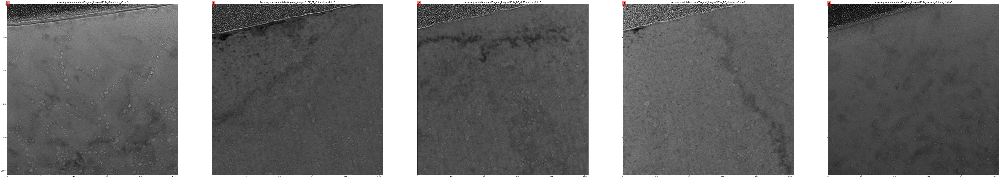

In [ ]:
fig, axes = plt.subplots(1, len(filepaths_dm3), figsize=(100, 100), sharex=True, sharey=True)
ax = axes.ravel()
for i in range(len(filepaths_dm3)):
    ax[i].imshow(acc_orig[:, :, i], cmap='gist_gray')
    ax[i].set_title(filepaths_dm3[i])
    ax[i].text(0.5, 0.5, i, size=20, bbox=dict(facecolor='red', alpha=0.5))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


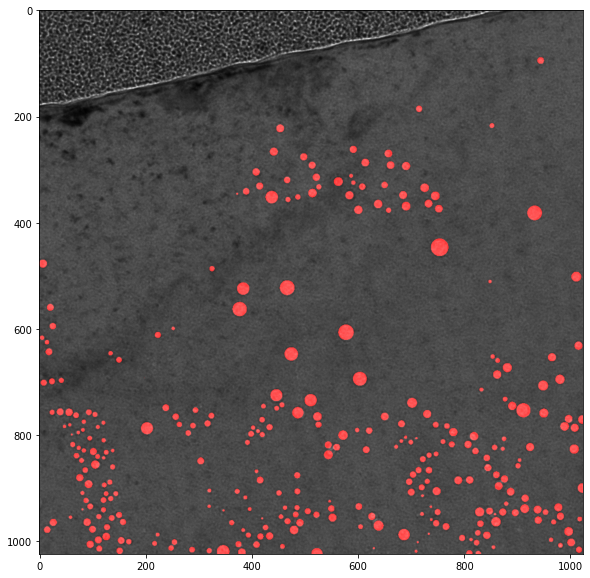

In [ ]:
i = 1
image = cv2.merge((acc_orig[:, :, i]+acc_lab_3[:, :, i], acc_orig[:, :, i], acc_orig[:, :, i]))
fig = plt.figure(figsize=(10, 10))
fig = plt.imshow(image)

Save numpy data in the testing data folder:

In [ ]:
# Save numpy data in the folder
os.chdir('Accuracy validation data')

_filename_dm3 = os.path.splitext('Original_Images')[0]+'.npy'
np.save(_filename_dm3, acc_orig)

_filename_lab_1 = os.path.splitext('Accuracy_Labels_1')[0]+'.npy'
np.save(_filename_lab_1, acc_lab_1)

_filename_lab_2 = os.path.splitext('Accuracy_Labels_2')[0]+'.npy'
np.save(_filename_lab_2, acc_lab_2)

_filename_lab_3 = os.path.splitext('Accuracy_Labels_3')[0]+'.npy'
np.save(_filename_lab_3, acc_lab_3)